### Database Config

In [61]:
import numpy as np
import pandas as pd
import psycopg2
import dotenv
import os
from matplotlib import animation
from matplotlib import pyplot as plt
from IPython.display import HTML

from mplsoccer import Pitch



dotenv.load_dotenv()

PG_PASSWORD = os.getenv("PG_PASSWORD")
PG_USER = os.getenv("PG_USER")
PG_HOST = os.getenv("PG_HOST")
PG_PORT = os.getenv("PG_PORT")
PG_DATABASE = os.getenv("PG_DB")

# Database connection parameters
import psycopg2
import os

conn = psycopg2.connect(
    host=PG_HOST,
    database=PG_DATABASE,
    user=PG_USER,
    password=PG_PASSWORD,
    port=PG_PORT,
    sslmode="require",
)



### Get Possesion Data

In [62]:
def get_possession_change_data(conn, game_id):

    possession_query = """
    WITH action_changes AS (
        SELECT
            a.*,
            LAG(a.team_id) OVER (ORDER BY a.period_id, a.seconds, a.id) AS prev_team_id,
            LEAD(a.team_id) OVER (ORDER BY a.period_id, a.seconds, a.id) AS next_team_id
        FROM
            spadl_actions a
        WHERE
            a.game_id = %s
    ),
    possession_markers AS (
        SELECT
            *,
            CASE 
                WHEN prev_team_id IS NULL OR team_id != prev_team_id 
                THEN 1 
                ELSE 0 
            END AS is_new_possession
        FROM
            action_changes
    ),
    possession_sequences AS (
        SELECT
            *,
            SUM(is_new_possession) OVER (ORDER BY period_id, seconds, id) AS possession_group
        FROM
            possession_markers
    ),
    possession_stats AS (
        SELECT
            possession_group,
            team_id,
            COUNT(*) AS action_count,
            MAX(id) AS last_action_id
        FROM
            possession_sequences
        GROUP BY
            possession_group, team_id
    )
    SELECT 
        s.id,
        s.period_id,
        s.seconds,
        s.action_type,
        s.team_id AS losing_team_id,
        s.next_team_id AS gaining_team_id,
        t1.team_name AS losing_team,
        t2.team_name AS gaining_team,
        s.start_x,
        s.start_y,
        s.end_x,
        s.end_y,
        ps.action_count
    FROM
        possession_sequences s
    JOIN
        possession_stats ps ON s.possession_group = ps.possession_group 
                             AND s.team_id = ps.team_id
                             AND s.id = ps.last_action_id
    JOIN teams t1 ON s.team_id = t1.team_id
    JOIN teams t2 ON s.next_team_id = t2.team_id
    WHERE
        ps.action_count >= 3
        AND s.team_id != s.next_team_id
        AND s.next_team_id IS NOT NULL
    ORDER BY
        s.period_id, s.seconds
    """

    possession_changes = pd.read_sql_query(possession_query, conn, params=(game_id,))
    possession_changes['match_id'] = game_id
    return possession_changes

df_possession = get_possession_change_data(conn, '5pcyhm34h5c948yji4oryevpw')
print(df_possession)

       id  period_id  seconds action_type             losing_team_id  \
0    2071          1      4.0           0  cyrrlv6l1onld5x247w1q1jlr   
1    2079          1     21.0           0  cyrrlv6l1onld5x247w1q1jlr   
2    2098          1     53.0          19  cyrrlv6l1onld5x247w1q1jlr   
3    2102          1     85.0           0  bw9wm8pqfzcchumhiwdt2w15c   
4    2138          1    142.0           7  cyrrlv6l1onld5x247w1q1jlr   
..    ...        ...      ...         ...                        ...   
172  3725          2   2754.0           0  bw9wm8pqfzcchumhiwdt2w15c   
173  3744          2   2789.0           7  bw9wm8pqfzcchumhiwdt2w15c   
174  3758          2   2822.0           0  bw9wm8pqfzcchumhiwdt2w15c   
175  3766          2   2842.0           7  bw9wm8pqfzcchumhiwdt2w15c   
176  3775          2   2852.0           0  cyrrlv6l1onld5x247w1q1jlr   

               gaining_team_id losing_team gaining_team  start_x  start_y  \
0    bw9wm8pqfzcchumhiwdt2w15c   Beerschot    OH Leuven   


### Get Tracking Data

In [63]:
def get_tracking_data(match_id):
    """Get player and ball tracking data for a time window."""

    # Query for player positions
    player_query = """
    SELECT 
        pt.frame_id,
        pt.timestamp,
        pt.period_id,
        pt.player_id,
        p.jersey_number,
        p.team_id,
        pt.x,
        pt.y
    FROM 
        player_tracking pt
    JOIN 
        players p ON pt.player_id = p.player_id
    WHERE 
        pt.game_id = %s
    ORDER BY 
        pt.frame_id, p.team_id
    """
    
    # Query for ball positions
    ball_query = """
    SELECT 
        pt.frame_id,
        pt.timestamp,
        pt.period_id,
        'ball' as player_id,
        NULL as jersey_number,
        NULL as team_id,
        pt.x,
        pt.y
    FROM 
        player_tracking pt
    WHERE 
        pt.game_id = %s
        AND pt.player_id = 'ball'
    ORDER BY 
        pt.frame_id
    """
    
    # Execute queries with proper parameter passing
    players_df = pd.read_sql_query(
        player_query, 
        conn, 
        params=[match_id]
    )
    
    ball_df = pd.read_sql_query(
        ball_query, 
        conn, 
        params=[match_id]
    )
    
    if players_df.empty or ball_df.empty:
        print(f"No data found for match_id: {match_id}")
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
    
    # Get team information
    team_ids = players_df['team_id'].unique()
    if len(team_ids) >= 2:
        home_team_id = players_df['team_id'].value_counts().index[0]
        away_team_id = players_df['team_id'].value_counts().index[1]
        
        # Split players by team
        home_df = players_df[players_df['team_id'] == home_team_id].copy()
        away_df = players_df[players_df['team_id'] == away_team_id].copy()
        
        # Add Frame column for consistency
        home_df['Frame'] = home_df['frame_id']
        away_df['Frame'] = away_df['frame_id']
        ball_df['Frame'] = ball_df['frame_id']

        home_df['timestamp'] = pd.to_timedelta(home_df['timestamp']).dt.total_seconds().astype(float)
        away_df['timestamp'] = pd.to_timedelta(away_df['timestamp']).dt.total_seconds().astype(float)
        ball_df['timestamp'] = pd.to_timedelta(ball_df['timestamp']).dt.total_seconds().astype(float)
        return home_df, away_df, ball_df
    else:
        print(f"Not enough teams found for match_id: {match_id}")
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

### Display Normal Animation


In [64]:
def display_Animation(players_df, ball_df):
    pitch = Pitch(pitch_type='metricasports', goal_type='line', pitch_width=68, pitch_length=105)
    fig, ax = pitch.draw(figsize=(16, 10.4))


    marker_kwargs = {'marker': 'o', 'markeredgecolor': 'black', 'linestyle': 'None'}
    ball, = ax.plot([], [], ms=6, markerfacecolor='w', zorder=3, **marker_kwargs)
    away, = ax.plot([], [], ms=10, markerfacecolor='#b94b75', **marker_kwargs) 
    home, = ax.plot([], [], ms=10, markerfacecolor='#7f63b8', **marker_kwargs)  



    def animate(i):
        """ Function to animate the data. Each frame it sets the data for the players and the ball."""
        # set the ball data with the x and y positions for the ith frame
        ball.set_data([ball_df.iloc[i]['x']/100],
                    [ball_df.iloc[i]['y']/100])
    
        frame = ball_df.iloc[i,0]

        frame_players = players_df[players_df['Frame'] == frame].dropna(subset=['x', 'y'])

        home_players = frame_players[frame_players['team']=='Home']
        away_players = frame_players[frame_players['team']=='Away']
        
    

        # set the player data using the frame id
        away.set_data(home_players['x']/100,
                    home_players['y']/100)
        home.set_data(away_players['x']/100,
                    away_players['y']/100)
       
        return ball, away, home


    # call the animator, animate so 25 frames per second
    anim = animation.FuncAnimation(fig, animate, frames=len(ball_df), interval=20, blit=True)
    HTML(anim.to_jshtml())

In [65]:
### Note for me: THE TIME IN SECONDS IS FOR EACH PERIOD, NOT TOTAL TIME
home_movement = pd.DataFrame()
away_movement = pd.DataFrame()
ball_movement = pd.DataFrame()
for _, row in df_possession.iterrows():
    
    match_id = row['match_id']
    start_time = row['seconds']
    end_time = start_time + 5  
    home_df, away_df, ball_df = get_tracking_data(match_id)
    
    if not home_df.empty and not away_df.empty and not ball_df.empty:
        home_df = home_df[(home_df['timestamp'] >= start_time) & (home_df['timestamp'] <= end_time)]
        away_df = away_df[(away_df['timestamp'] >= start_time) & (away_df['timestamp'] <= end_time)]
        ball_df = ball_df[(ball_df['timestamp'] >= start_time) & (ball_df['timestamp'] <= end_time)]
        home_df['team'] = 'Home'
        away_df['team'] = 'Away'
        players_df  = pd.concat([home_df, away_df])
        home_movement = home_df[['Frame', 'x', 'y']].copy()
        away_movement = away_df[['Frame', 'x', 'y']].copy()
        ball_movement = ball_df[['Frame', 'x', 'y']].copy()
        home_movement['Possesion_Transition'] = row.index
        away_movement['Possesion_Transition'] = row.index
        ball_movement['Possesion_Transition'] = row.index
        home_movement['team'] = 'Home'
        away_movement['team'] = 'Away'
        ball_movement['team'] = 'Ball'
        
        

        
    else:
        print(f"Data retrieval failed for match_id: {match_id}, start_time: {start_time}")

players_movement = pd.concat([home_movement, away_movement])
display_Animation(players_movement, ball_movement)


ValueError: Length of values (14) does not match length of index (121)

In [66]:
print(away_df.head())
print(ball_df.head())

          frame_id  timestamp  period_id                  player_id  \
104  1722104104000        4.0          1  d6eq2hlmwh2hpbx4m3qjiuxud   
105  1722104104000        4.0          1  a5vn2mnrgj73rtfyt5n61g12i   
106  1722104104000        4.0          1  3krbtvbsbwqscf0tfi5i4nxed   
107  1722104104000        4.0          1  7qkoogt2mpaqmmwyjgdzqe6zt   
108  1722104104000        4.0          1  6g9x1y7xmjzwhk646v1iyuup5   

     jersey_number                    team_id          x          y  \
104              3  cyrrlv6l1onld5x247w1q1jlr  65.465026  55.270400   
105             47  cyrrlv6l1onld5x247w1q1jlr  36.523052  22.735655   
106             26  cyrrlv6l1onld5x247w1q1jlr  63.732672  35.659609   
107             71  cyrrlv6l1onld5x247w1q1jlr  89.122855  52.654426   
108             10  cyrrlv6l1onld5x247w1q1jlr  39.990422  49.325902   

             Frame  team  
104  1722104104000  Away  
105  1722104104000  Away  
106  1722104104000  Away  
107  1722104104000  Away  
108  172210

### Merge DataFrame

In [67]:
home_df, away_df, ball_df = get_tracking_data("5pcyhm34h5c948yji4oryevpw")
# print("Home Team DataFrame:\n", home_df)
home_df['team'] = 'Home'
away_df['team'] = 'Away'
players_df  = pd.concat([home_df, away_df])
print("Players DataFrame:\n", players_df)

Players DataFrame:
              frame_id  timestamp  period_id                  player_id  \
1       1722104100000       0.00          1  1fdi6uzonmsod2drzro8bj3rp   
2       1722104100000       0.00          1  f09fob6aosvvlheynznavew2x   
3       1722104100000       0.00          1  aln8shv9r2xqyfv8qsvva7pey   
4       1722104100000       0.00          1  f3e9qk9oz4feldhgetdpcd0ph   
5       1722104100000       0.00          1  9fvwcsajeousbo5o0e84cj2sp   
...               ...        ...        ...                        ...   
128726  1722110590480    2890.48          2  70hrswpx2bj9obwqpxyox9xey   
128727  1722110590480    2890.48          2  b77p0um20y057708bx6on4d4a   
128728  1722110590480    2890.48          2  a5vn2mnrgj73rtfyt5n61g12i   
128729  1722110590480    2890.48          2  d6eq2hlmwh2hpbx4m3qjiuxud   
128730  1722110590480    2890.48          2  2ky2kn7gpjorkyg9zyg68pk6i   

        jersey_number                    team_id          x          y  \
1                

### Voronoi Animation


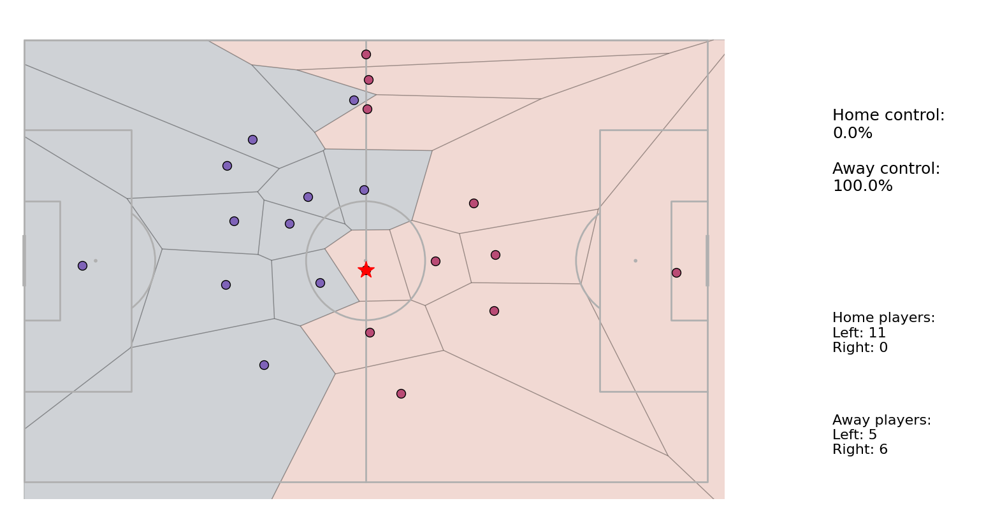

In [68]:
from scipy.spatial import Voronoi, voronoi_plot_2d
from matplotlib.collections import PatchCollection
from matplotlib import animation, pyplot as plt, gridspec
from matplotlib.patches import Polygon
import matplotlib.patches as mpatches
from shapely.geometry import Polygon as ShapelyPolygon, box
fig = plt.figure(figsize=(20, 10.4))
gs = gridspec.GridSpec(1, 2, width_ratios=[4, 1])
ax_pitch = fig.add_subplot(gs[0])
ax_possession = fig.add_subplot(gs[1])
ax_possession.axis('off')

# Create pitch
pitch = Pitch(pitch_type='metricasports', goal_type='line', pitch_width=68, pitch_length=105)
pitch.draw(ax=ax_pitch)

# Create plot elements
marker_kwargs = {'marker': 'o', 'markeredgecolor': 'black', 'linestyle': 'None'}
ball_dot, = ax_pitch.plot([], [], ms=6, markerfacecolor='white', zorder=3, **marker_kwargs)
home_dot, = ax_pitch.plot([], [], ms=10, markerfacecolor='#7f63b8', **marker_kwargs)
away_dot, = ax_pitch.plot([], [], ms=10, markerfacecolor='#b94b75', **marker_kwargs)
ball_holder_marker, = ax_pitch.plot([], [], marker='*', color='red', markersize=20, zorder=4)

# Text displays
possession_display = ax_possession.text(0.1, 0.8, "", fontsize=18, va='top')
home_half_count_display = ax_possession.text(0.1, 0.4, "", fontsize=16, va='top')
away_half_count_display = ax_possession.text(0.1, 0.2, "", fontsize=16, va='top')
voronoi_patches = []
def bounded_voronoi_regions(vor, pitch_width=68, pitch_length=105):
    bbox = box(0, 0, pitch_length, pitch_width)
    regions = []
    for region_idx in vor.point_region:
        vertices = vor.regions[region_idx]
        if -1 in vertices or len(vertices) == 0:
            regions.append(None)
            continue
        poly = ShapelyPolygon(vor.vertices[vertices])
        poly = poly.intersection(bbox)
        if not poly.is_empty and isinstance(poly, ShapelyPolygon):
            regions.append(poly)
        else:
            regions.append(None)
    return regions


def animate(i):
    global voronoi_patches

    for patch in voronoi_patches:
        patch.remove()
    voronoi_patches = []

    ball_frame = ball_df.iloc[i]
    ball_x = ball_frame['x'] / 100
    ball_y = ball_frame['y'] / 100
    frame_id = ball_frame['frame_id']

    ball_dot.set_data([ball_x], [ball_y])

    frame_players = players_df[players_df['frame_id'] == frame_id].dropna(subset=['x', 'y'])
    x = frame_players['x'] / 100
    y = frame_players['y'] / 100
    team = frame_players['team'].values
    points = np.vstack((x.values, y.values)).T

    home_players = frame_players[frame_players['team'] == 'Home']
    away_players = frame_players[frame_players['team'] == 'Away']

    home_dot.set_data(home_players['x'] / 100, home_players['y'] / 100)
    away_dot.set_data(away_players['x'] / 100, away_players['y'] / 100)

    home_area = 0
    away_area = 0

    if len(points) >= 4:
        ghost_margin = 30 
        ghost_spacing = 20  

        x_ghosts = np.arange(-ghost_margin, 105 + ghost_margin + 1, ghost_spacing)
        y_ghosts = np.arange(-ghost_margin, 68 + ghost_margin + 1, ghost_spacing)

        ghost_points = []
        for gx in x_ghosts:
            ghost_points.append([gx, -ghost_margin])       
            ghost_points.append([gx, 68 + ghost_margin])   
        for gy in y_ghosts:
            ghost_points.append([-ghost_margin, gy])       
            ghost_points.append([105 + ghost_margin, gy]) 
        ghost_points = np.array(ghost_points)

        all_points = np.vstack((points, ghost_points))
        vor = Voronoi(all_points)

        regions = bounded_voronoi_regions(vor)

        # Only use regions corresponding to the players.
        num_players = len(points)
        player_regions = regions[:num_players]
        # Create team colors and labels for players only.
        team_colors = ['#111f34' if t == 'Home' else '#b94523' for t in team]
        team_labels = list(team)

        for region, color, tlabel in zip(player_regions, team_colors, team_labels):
            if region:
                area = region.area
                patch = Polygon(list(region.exterior.coords), alpha=0.2, edgecolor='black', facecolor=color, zorder=0)
                ax_pitch.add_patch(patch)
                voronoi_patches.append(patch)
                if tlabel == 'Home':
                    home_area += area
                else:
                    away_area += area

    total_area = home_area + away_area
    if total_area > 0:
        home_pct = 100 * home_area / total_area
        away_pct = 100 * away_area / total_area
        possession_display.set_text(f"Home control:\n{home_pct:.1f}%\n\nAway control:\n{away_pct:.1f}%")
    else:
        possession_display.set_text("Pitch Control\n-")

    home_x_positions = home_players['x'] 
    home_left_half = (home_x_positions < 52.5).sum()
    home_right_half = (home_x_positions >= 52.5).sum()

    away_left_half = (away_players['x'] < 52.5).sum()
    away_right_half = (away_players['x'] >= 52.5).sum()



    home_half_count_display.set_text(
        f"Home players:\nLeft: {home_left_half}\nRight: {home_right_half}"
     )
    away_half_count_display.set_text(
        f"Away players:\nLeft: {away_left_half}\nRight: {away_right_half}"
    )   

    if len(points) > 0:
        ball_pos = np.array([ball_x, ball_y])
        dists = np.linalg.norm(points - ball_pos, axis=1)
        closest = np.argmin(dists)
        closest_x, closest_y = points[closest]
        ball_holder_marker.set_data([closest_x], [closest_y])
    else:
        ball_holder_marker.set_data([], [])

    return ball_dot, home_dot, away_dot, ball_holder_marker, possession_display, home_half_count_display, *voronoi_patches

# Create animation
anim = animation.FuncAnimation(fig, animate, frames=100, interval=100, blit=False)
HTML(anim.to_jshtml())